In [28]:
import subprocess
import os
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import clear_output
import json
import pandas as pd
import numpy as np

In [3]:
def generate_cmd():
    bas_cmd = "python demo.py --input [INPUT] --model ./mit_b4.pth --prompt ./prompt_epoch_last.pth --resolution 320,320 --config configs/demo.yaml --output [OUTPUT]"
    base_path = "/home/msouda/Workspace/Explicit-Visual-Prompt/example/test"
    list_of_files = os.listdir(base_path)
    print(f"Files in {base_path}: ", list_of_files)
    for x in list_of_files:
        if x.endswith(".jpg"):
            if not x.endswith("_pred.jpg"):
                pass
                #subprocess.call("pyenv activate EVP; cd Workspace/Explicit-Visual-Prompt;"+bas_cmd.replace("[INPUT]", os.path.join(base_path, x)).replace("[OUTPUT]", os.path.join(base_path, x.replace(".jpg", "_pred.jpg"))), shell=True)
                #print("Processing: ", os.path.join(base_path, x))
            else:
                os.remove(os.path.join(base_path, x))

In [4]:
generate_cmd()

Files in /home/msouda/Workspace/Explicit-Visual-Prompt/example/test:  ['fr2_20160117T132753_s1_f0.jpg', 'fr3_20160325T192343_s4_f0.jpg', 'tf1_20110414T131419_s3_f0.jpg', 'tf1_20191006T201918_s2_f0.jpg', 'tf1_20141018T174624_s1_f0.jpg', 'art_20220916T232612_s3_f0.jpg', 'itl_20161222T204532_s2_f0.jpg', 'fr3_20210713T123518_s1_f0.jpg', 'fr2_20230228T133119_s4_f0.jpg', 'tf1_20110712T221359_s3_f0.jpg', 'c+n_20200927T185056_s3_f0.jpg', 'c+__20130808T213725_s3_f0.jpg']


In [2]:
cmd = "python demo.py --input ./example/test/c+__20130808T213725_s3_f0.jpg --model ./mit_b4.pth --prompt ./prompt_epoch_last.pth --resolution 320,320 --config configs/demo.yaml --output ./example/test/c+__20130808T213725_s3_f0_pred.jpg"
subprocess.run(cmd, shell=True)

CompletedProcess(args='python demo.py --input ./example/test/c+__20130808T213725_s3_f0.jpg --model ./mit_b4.pth --prompt ./prompt_epoch_last.pth --resolution 320,320 --config configs/demo.yaml --output ./example/test/c+__20130808T213725_s3_f0_pred.jpg', returncode=2)

In [6]:

df = pd.read_json("/home/msouda/Datasets/new_synth_anonymized/img_info.json")
df

KeyboardInterrupt: 

In [ ]:
df2 = df.T

In [ ]:
df2 = df2.reset_index().rename(columns={"index": "filename"}).assign(filename=lambda x: x["filename"].apply(lambda y: y.split("_s")[0]+'/'+y))
df2

,filename,coord,surface%,laplacian,global_laplacian,blur_score,front_score,class
0,tf1_20120828T172307/tf1_20120828T172307_s1_f0.jpg,"{'x1': 14, 'y1': 133, 'x2': 168, 'y2': 246}",0.151733,30.9318,41.9025,18.229,0.31571,0
1,tf1_20120828T172307/tf1_20120828T172307_s3_f0.jpg,"{'x1': 17, 'y1': 111, 'x2': 168, 'y2': 225}",0.150094,27.7604,44.2731,16.1833,0.317798,0
2,tf1_20120828T172307/tf1_20120828T172307_s2_f0.jpg,"{'x1': 14, 'y1': 118, 'x2': 164, 'y2': 227}",0.142561,22.8855,41.0924,12.6718,0.325418,0
3,m6__20190710T233831/m6__20190710T233831_s1_f0.jpg,"{'x1': 38, 'y1': 339, 'x2': 138, 'y2': 419}",0.0154321,177.628,196.147,102.314,0.223771,0
4,m6__20190710T233831/m6__20190710T233831_s3_f0.jpg,"{'x1': 64, 'y1': 467, 'x2': 116, 'y2': 511}",0.00441358,365.738,216.9,60.2503,0.292685,0
...,...,...,...,...,...,...,...,...
623686,fr2_20210702T204847/fr2_20210702T204847_s1_f0.jpg,"{'x1': 112, 'y1': 680, 'x2': 506, 'y2': 931}",0.190768,24.6197,75.1453,175.301,0.0116625,0
623687,fr2_20210702T204847/fr2_20210702T204847_s4_f0.jpg,NaN,NaN,NaN,NaN,NaN,NaN,0
623688,bft_20161219T023208/bft_20161219T023208_s2_f0.jpg,NaN,NaN,NaN,NaN,NaN,NaN,0
623689,bft_20161219T023208/bft_20161219T023208_s3_f0.jpg,NaN,NaN,NaN,NaN,NaN,NaN,0


In [34]:
df2[['filename', 'class']].to_csv("/home/msouda/Datasets/new_synth_anonymized/paths_and_labels.csv", index=False)

In [35]:
pd.read_csv("/home/msouda/Datasets/new_synth_anonymized/paths_and_labels.csv")

,filename,class
0,tf1_20120828T172307/tf1_20120828T172307_s1_f0.jpg,0.0
1,tf1_20120828T172307/tf1_20120828T172307_s3_f0.jpg,0.0
2,tf1_20120828T172307/tf1_20120828T172307_s2_f0.jpg,0.0
3,m6__20190710T233831/m6__20190710T233831_s1_f0.jpg,0.0
4,m6__20190710T233831/m6__20190710T233831_s3_f0.jpg,0.0
...,...,...
623686,fr2_20210702T204847/fr2_20210702T204847_s1_f0.jpg,0.0
623687,fr2_20210702T204847/fr2_20210702T204847_s4_f0.jpg,0.0
623688,bft_20161219T023208/bft_20161219T023208_s2_f0.jpg,0.0
623689,bft_20161219T023208/bft_20161219T023208_s3_f0.jpg,0.0


In [2]:
from torchvision import transforms
img_transform = transforms.Compose([
        #transforms.Resize((320, 320)),
        transforms.ToTensor(),
        # transforms.Normalize(mean=[0.485, 0.456, 0.406],
        #                      std=[0.229, 0.224, 0.225])
    ])

/home/msouda/.pyenv/versions/3.9.18/envs/face_detection/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



 ________Image: art_20210409T231031_s3_f0.jpg________



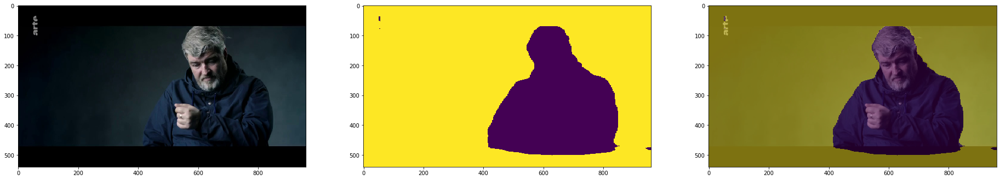


 ________Image: c+n_20211220T101833_s4_f0.jpg________



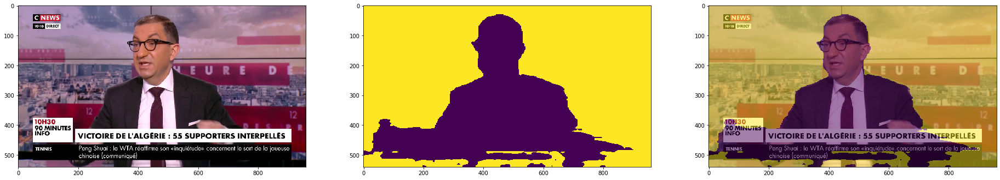


 ________Image: itl_20140117T010049_s4_f0.jpg________



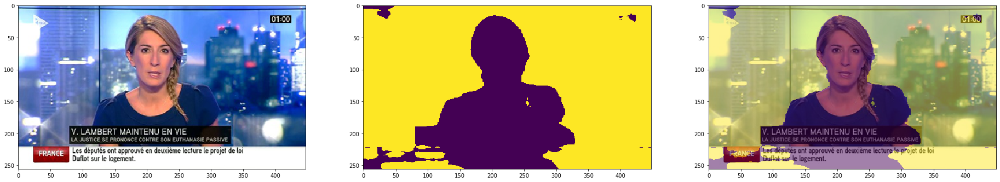


 ________Image: c+__20210221T234355_s4_f0.jpg________



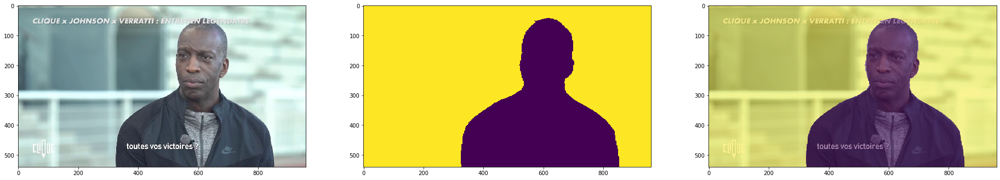


 ________Image: bft_20100416T230341_s08_f0.jpg________



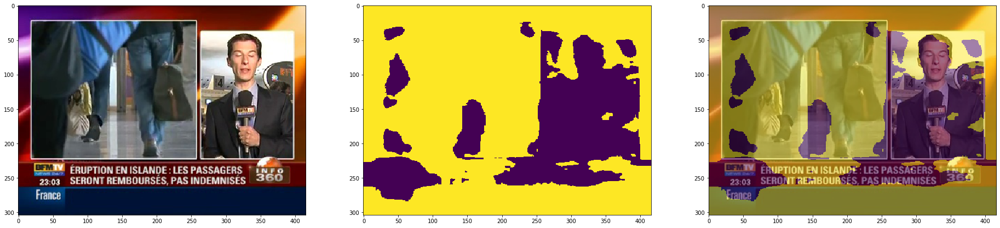


 ________Image: m6__20120829T230404_s1_f0.jpg________



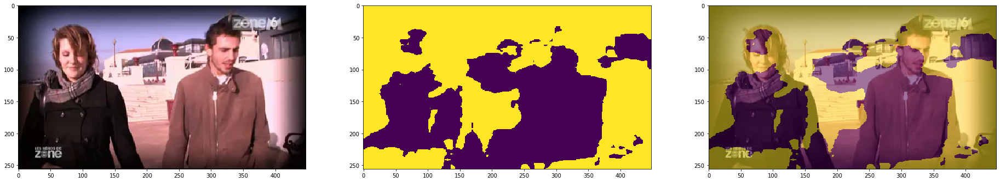


 ________Image: bft_20150624T073709_s1_f0.jpg________



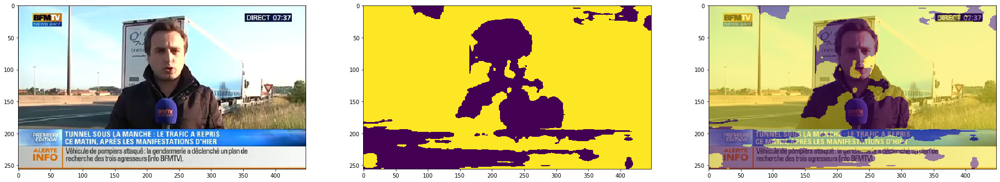


 ________Image: bft_20121028T182419_s2_f0.jpg________



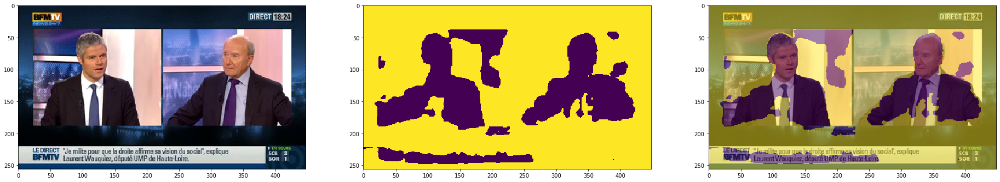


 ________Image: art_20231119T185523_s2_f0.jpg________



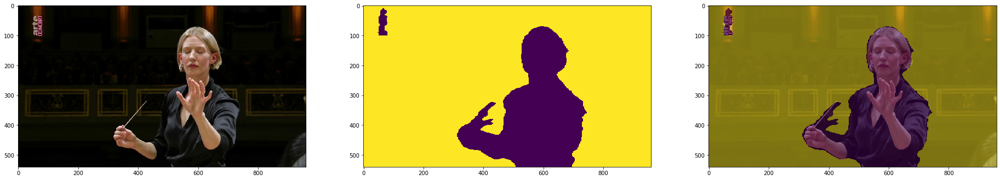


 ________Image: tf1_20150605T132813_s3_f0.jpg________



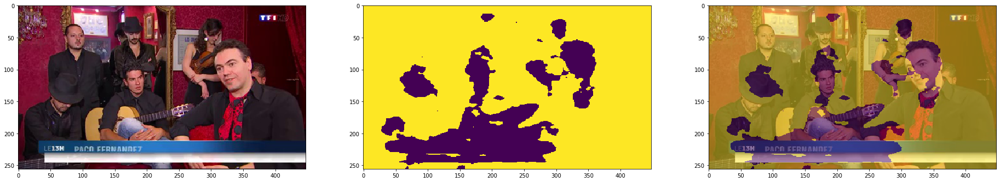


 ________Image: c+n_20230809T080417_s2_f0.jpg________



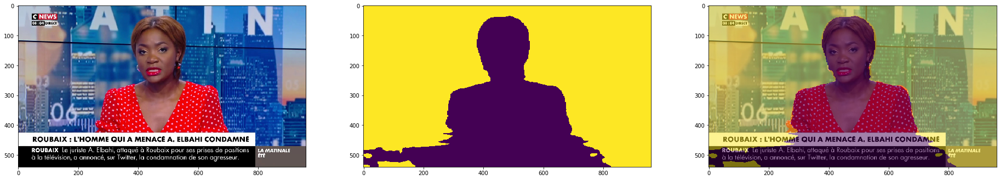


 ________Image: m6__20100326T172457_s1_f0.jpg________



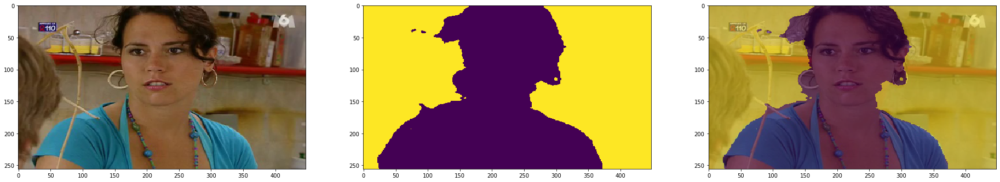


 ________Image: m6__20150127T243131_s1_f0.jpg________



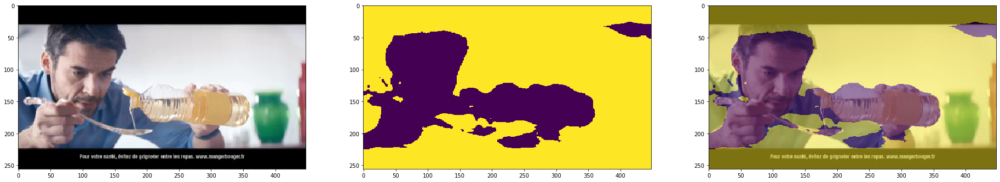


 ________Image: c+n_20200113T001854_s1_f0.jpg________



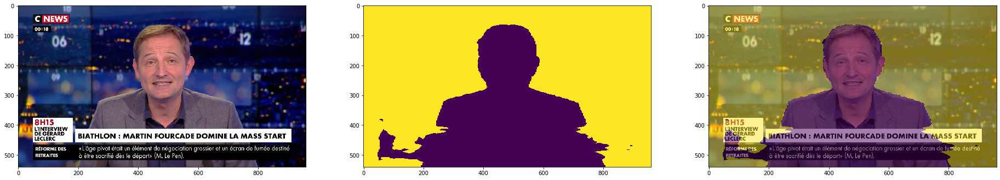


 ________Image: m6__20180730T141429_s1_f0.jpg________



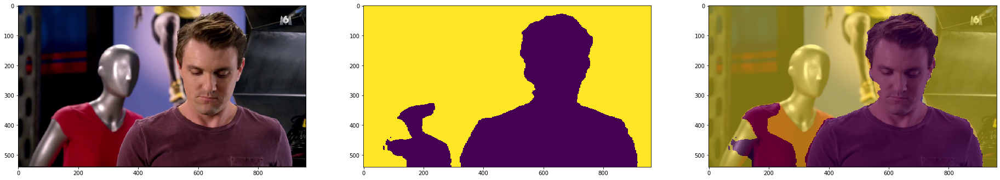


 ________Image: tf1_20190826T154456_s2_f0.jpg________



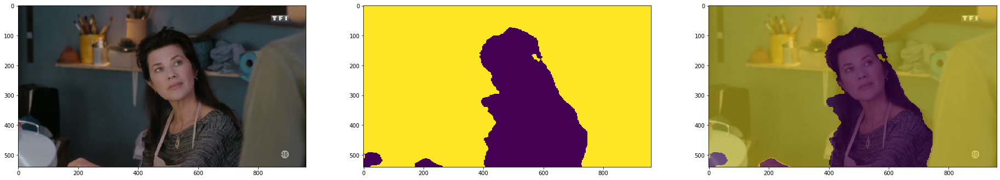


 ________Image: m6__20190126T191805_s4_f0.jpg________



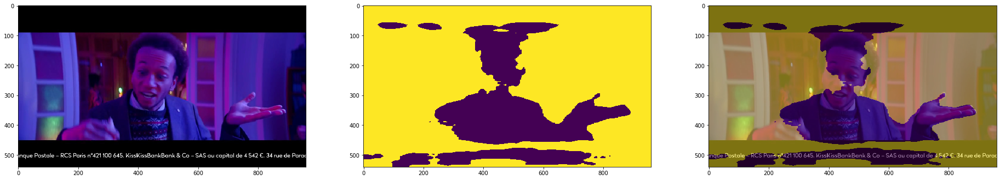


 ________Image: c+n_20230908T144341_s1_f0.jpg________



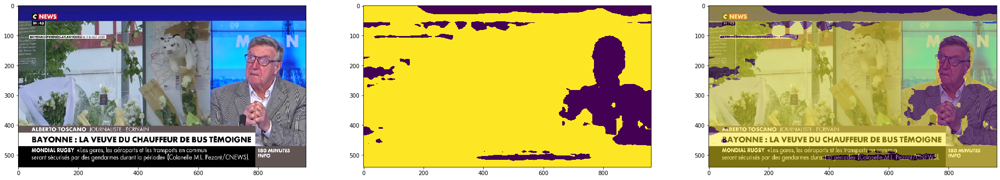


 ________Image: c+n_20230823T181021_s2_f0.jpg________



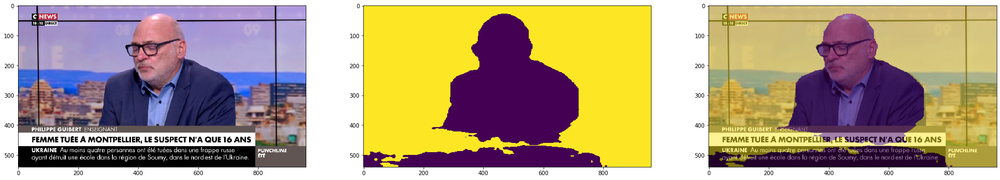


 ________Image: c+n_20230708T024510_s3_f0.jpg________



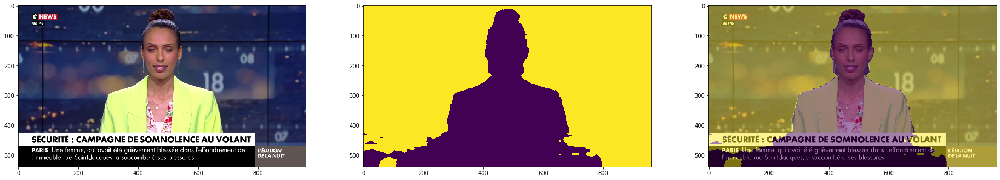


 ________Image: art_20150312T240144_s1_f0.jpg________



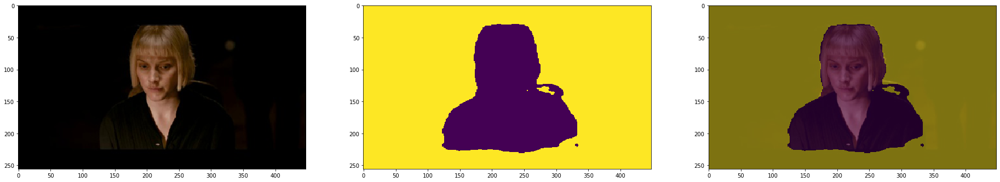


 ________Image: c+__20110716T213215_s2_f0.jpg________



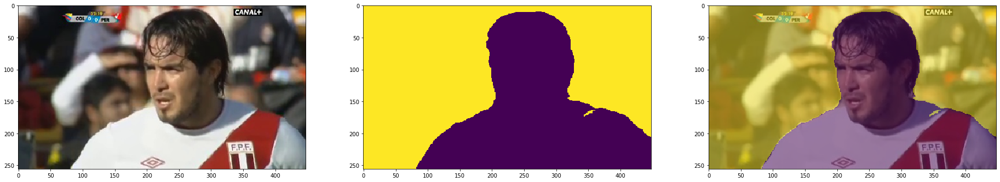


 ________Image: fr2_20230518T204858_s3_f0.jpg________



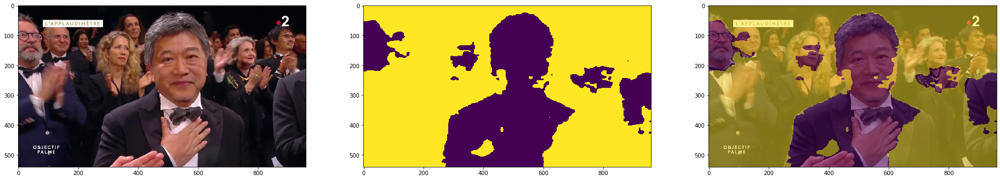


 ________Image: itl_20140218T063513_s2_f0.jpg________



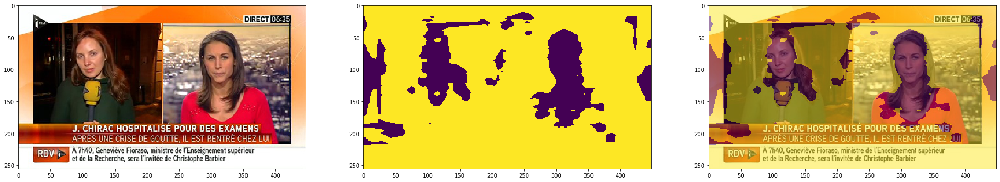


 ________Image: fr2_20100309T184016_s4_f0.jpg________



KeyboardInterrupt: 

In [8]:
mask_path = "/home/msouda/Datasets/new_synth_test_defocus"
folders = os.listdir(mask_path)
base_path = "/home/msouda/Datasets/new_synth"
for folder in folders:
    files = os.listdir(os.path.join("/home/msouda/Datasets/new_synth_test_defocus", folder))
    for file in files:
        fig, ax = plt.subplots(1,3, figsize=(32,18))
        img = Image.open(os.path.join(base_path, folder, file))
        h,w = img.size
        print(f"\n ________Image: {file}________\n")
        img = img_transform(img).unsqueeze(0)
        mask = Image.open(os.path.join(mask_path, folder, file))
        mask = mask.resize((h,w))
        mask = img_transform(mask)
        mask = (mask<0.5).float()[0]
        ax[0].imshow(img[0].permute(1,2,0).detach().numpy())
        ax[1].imshow(mask)
        ax[2].imshow(img[0].permute(1,2,0).detach().numpy())
        ax[2].imshow(mask, alpha=0.5)
        plt.show()

In [18]:
mask_path = "/home/msouda/Datasets/new_synth_defocus"
folders = os.listdir(mask_path)
share_path = "/home/msouda/Datasets/new_synth_for_share"
os.mkdir(share_path)
base_path = "/home/msouda/Datasets/new_synth"
for folder in folders:
    if len(folder.split("."))==1:
        os.mkdir(os.path.join(share_path, folder))
        files = os.listdir(os.path.join(mask_path, folder))
        for file in files:
            subprocess.run(f"cp {os.path.join(base_path, folder, file)} {os.path.join(share_path, folder)}", shell=True)


In [18]:
with open("/home/msouda/Datasets/new_synth_defocus/keep_throw.json", "r") as f:
    keep_throw = json.load(f)

to_keep = keep_throw["keep"]
to_throw = keep_throw["throw"]

812

 ________Image: art_20131105T204627_s1_f0.jpg________



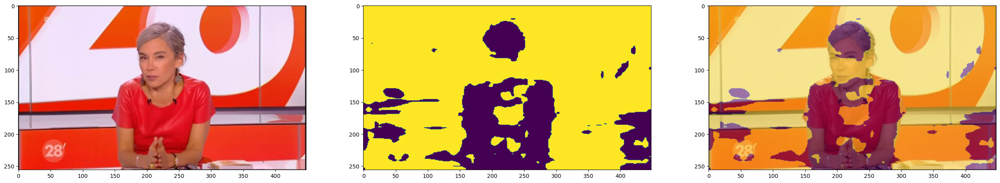

Quitting with 812 images to keep and 8315 images to throw.


In [19]:
mask_path = "/home/msouda/Datasets/new_synth_defocus"
folders = os.listdir(mask_path)
base_path = "/home/msouda/Datasets/new_synth"
quit = False
for folder in folders:
    if folder.startswith(("c+n", "itl", "bft")):
        continue
    if quit:
        print(f"Quitting with {len(to_keep)} images to keep and {len(to_throw)} images to throw.")
        break
    files = os.listdir(os.path.join("/home/msouda/Datasets/new_synth_defocus", folder))
    print(f"Folder: {folder} : {len(files)} images to come.")
    for file in files:
        name = os.path.join(folder, file)
        if name in to_keep or name in to_throw:
            clear_output(wait=True)
            continue
        fig, ax = plt.subplots(1,3, figsize=(32,18))
        img = Image.open(os.path.join(base_path, folder, file))
        h,w = img.size
        print(f"\n ________Image: {file}________\n")
        img = img_transform(img).unsqueeze(0)
        mask = Image.open(os.path.join(mask_path, folder, file))
        mask = mask.resize((h,w))
        mask = img_transform(mask)
        mask = (mask<0.5).float()[0]
        ax[0].imshow(img[0].permute(1,2,0).detach().numpy())
        ax[1].imshow(mask)
        ax[2].imshow(img[0].permute(1,2,0).detach().numpy())
        ax[2].imshow(mask, alpha=0.5)
        plt.show()

        key = input("Keep? (y/n) (quit with q)")
        if key == "y":
            to_keep.append(name)
        elif key == "q":
            quit = True
            break
        else:
            to_throw.append(name)
        clear_output(wait=True)
        print(len(to_keep))

In [22]:
defocus_synt = {
    "keep": to_keep,
    "throw": to_throw
}
with open("/home/msouda/Datasets/new_synth_defocus/keep_throw.json", "w") as f:
    json.dump(defocus_synt, f)

In [94]:
len(to_keep)

812

In [93]:
defocus_mask_path = "/home/msouda/Datasets/new_synth_defocus"
anonym_mask_path = "/home/msouda/Datasets/new_synth_masks"
img_path = "/home/msouda/Datasets/new_synth_anonymized"
new_masks_path = "/home/msouda/Datasets/new_synth_masks_ano_defocus"

for x in to_keep:
    folder, file = x.split("/")
    anonym_mask = np.array(Image.open(os.path.join(anonym_mask_path, x)))[:,:,0]>25
    anonym_mask = anonym_mask.astype(int)
    h,w = anonym_mask.shape
    defocus_mask = np.array(Image.open(os.path.join(defocus_mask_path, x)).resize((w,h)))>25
    defocus_mask = defocus_mask.astype(int)
    defocus_mask = np.logical_not(defocus_mask).astype(int)
    # img = Image.open(os.path.join(img_path, x))
    mask = anonym_mask.copy()
    mask[mask==0] = defocus_mask[mask==0]*2
    mask = mask.astype(np.uint8)

    print(mask.dtype)
    if not os.path.exists(os.path.join(new_masks_path, folder)):
        os.mkdir(os.path.join(new_masks_path, folder))
    Image.fromarray(mask).save(os.path.join(new_masks_path, x).replace('jpg', 'png'))


uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint

In [95]:
to_keep

['fr2_20200513T240914/fr2_20200513T240914_s2_f0.jpg',
 'fr2_20190516T234650/fr2_20190516T234650_s1_f0.jpg',
 'fr2_20190516T234650/fr2_20190516T234650_s2_f0.jpg',
 'c+__20200507T220003/c+__20200507T220003_s4_f0.jpg',
 'c+__20200507T220003/c+__20200507T220003_s3_f0.jpg',
 'c+__20110227T143404/c+__20110227T143404_s4_f0.jpg',
 'm6__20110226T232656/m6__20110226T232656_s1_f0.jpg',
 'm6__20110226T232656/m6__20110226T232656_s3_f0.jpg',
 'fr3_20120907T181517/fr3_20120907T181517_s2_f0.jpg',
 'fr3_20120907T181517/fr3_20120907T181517_s1_f0.jpg',
 'c+n_20230825T104743/c+n_20230825T104743_s1_f0.jpg',
 'fr2_20200703T200917/fr2_20200703T200917_s3_f0.jpg',
 'fr2_20200526T200558/fr2_20200526T200558_s2_f0.jpg',
 'art_20140924T202019/art_20140924T202019_s5_f0.jpg',
 'bft_20141023T182406/bft_20141023T182406_s3_f0.jpg',
 'fr3_20110212T194207/fr3_20110212T194207_s3_f0.jpg',
 'fr3_20110212T194207/fr3_20110212T194207_s2_f0.jpg',
 'art_20110531T235554/art_20110531T235554_s1_f0.jpg',
 'art_20110531T235554/art_20

In [96]:
mask_annot_3 = pd.DataFrame(columns=["image", "mask"])
mask_annot_3["image"] = to_keep
mask_annot_3["mask"] = mask_annot_3["image"].apply(lambda x: x.replace("jpg", "png"))
mask_annot_3["image"] = mask_annot_3["image"].apply(lambda x: os.path.join("new_synth_anonymized", x))
mask_annot_3["mask"] = mask_annot_3["mask"].apply(lambda x: os.path.join("new_synth_masks_ano_defocus", x))
mask_annot_3.to_csv("/home/msouda/Datasets/new_synth_masks_ano_defocus/annotations.csv", index=False, header=False)

In [97]:
None.to_list()

AttributeError: 'NoneType' object has no attribute 'to_list'